In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import librosa
import librosa.display
from IPython.display import Audio
from scipy.io import wavfile
import warnings
warnings.filterwarnings('ignore')

In [2]:
paths = []
labels = []
for dirname, _, filenames in os.walk('./NewDatasetChng/Recordings/'):
    for filename in filenames:
        paths.append(os.path.join(dirname, filename))
        label = filename.split('_')[-1]
        label = label.split('.')[0]
        labels.append(label.lower())
    if len(paths) == 2800:
        break
print('Dataset is Loaded')

Dataset is Loaded


In [3]:
len(paths)

30

In [4]:
paths[:5]


['./NewDatasetChng/Recordings/10_asthma.wav',
 './NewDatasetChng/Recordings/10_normal.wav',
 './NewDatasetChng/Recordings/11_asthma.wav',
 './NewDatasetChng/Recordings/11_normal.wav',
 './NewDatasetChng/Recordings/12_asthma.wav']

In [5]:
labels[:5]


['asthma', 'normal', 'asthma', 'normal', 'asthma']

In [6]:
## Create a dataframe
df = pd.DataFrame()
df['sound'] = paths
df['label'] = labels
df.head()

,sound,label
0,./NewDatasetChng/Recordings/10_asthma.wav,asthma
1,./NewDatasetChng/Recordings/10_normal.wav,normal
2,./NewDatasetChng/Recordings/11_asthma.wav,asthma
3,./NewDatasetChng/Recordings/11_normal.wav,normal
4,./NewDatasetChng/Recordings/12_asthma.wav,asthma


In [7]:
df['label'].value_counts()

label
asthma    15
normal    15
Name: count, dtype: int64

<Axes: xlabel='count', ylabel='label'>

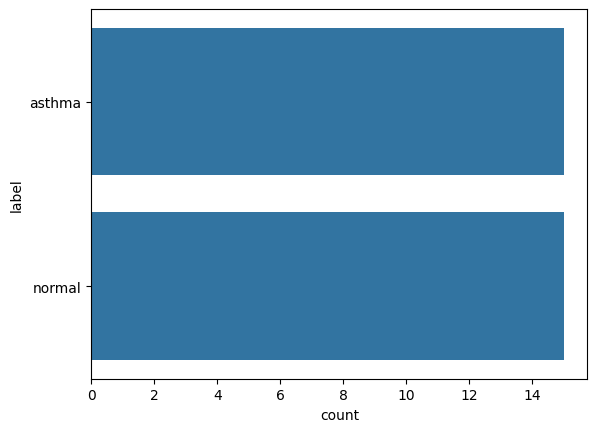

In [8]:
sns.countplot(df['label'])

In [9]:
dx = pd.read_excel('./NewDatasetChng/sounds.xlsx')

In [10]:
dx

,index,fname,label
0,0,1_asthma.wav,asthma
1,1,2_asthma.wav,asthma
2,2,3_asthma.wav,asthma
3,3,4_asthma.wav,asthma
4,4,5_asthma.wav,asthma
5,5,6_asthma.wav,asthma
6,6,7_asthma.wav,asthma
7,7,8_asthma.wav,asthma
8,8,9_asthma.wav,asthma
9,9,10_asthma.wav,asthma


In [11]:
dx.set_index('fname',inplace=True)

In [12]:
for f in dx.index:
    rate, signal = wavfile.read('./NewDatasetChng/Recordings/'+f)
    dx.at[f, 'length'] = signal.shape[0]/rate

In [13]:
classes = list(np.unique(df.label))
class_dist = dx.groupby(['label'])['length'].mean()

In [14]:
classes

['asthma', 'normal']

In [15]:
class_dist

label
asthma    41.280443
normal    30.392889
Name: length, dtype: float64

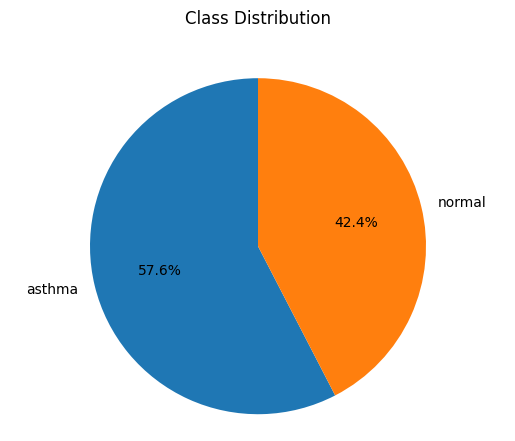

In [16]:
fig, ax = plt.subplots()
ax.set_title('Class Distribution', y = 1.08)
ax.pie(class_dist, labels = class_dist.index, autopct='%1.1f%%',
       shadow=False, startangle=90)

ax.axis('equal')
plt.show()
dx.reset_index(inplace=True)

In [17]:
def waveplot(data, sr, sound):
    plt.figure(figsize=(10,4))
    plt.title(sound, size=20)
    librosa.display.waveshow(data, sr=sr, color='b')
    plt.show()
    
def spectogram(data, sr, sound):
    x = librosa.stft(data)
    xdb = librosa.amplitude_to_db(abs(x))
    plt.figure(figsize=(11,4))
    plt.title(sound, size=20)
    librosa.display.specshow(xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()

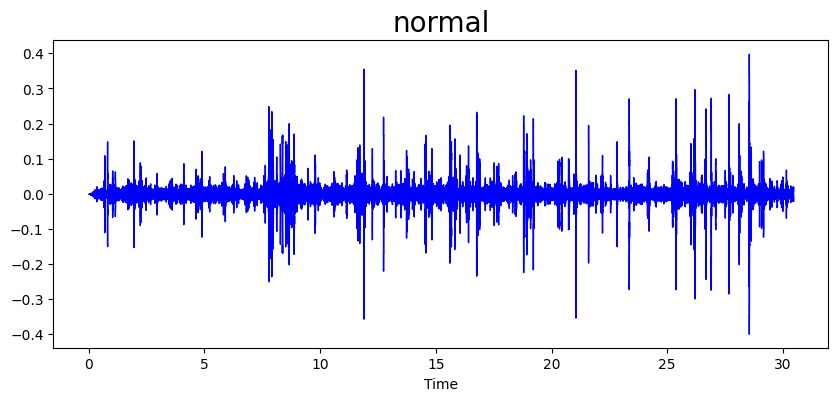

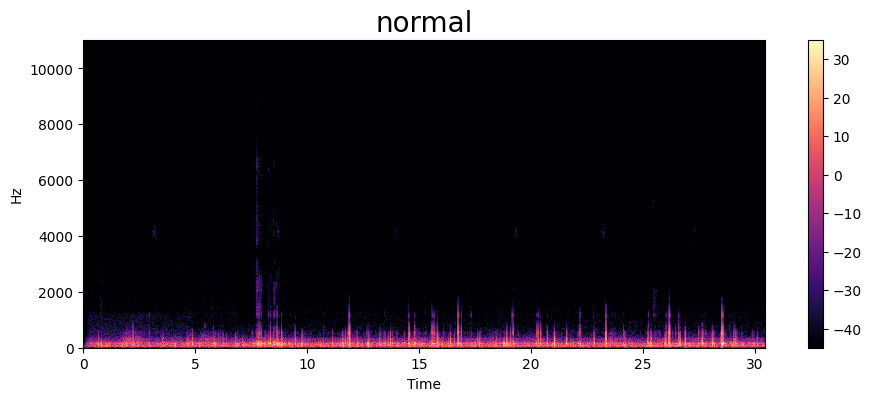

In [18]:
sound = 'normal'
path = np.array(df['sound'][df['label']==sound])[0]
data, sampling_rate = librosa.load(path)
waveplot(data, sampling_rate, sound)
spectogram(data, sampling_rate, sound)
Audio(path)

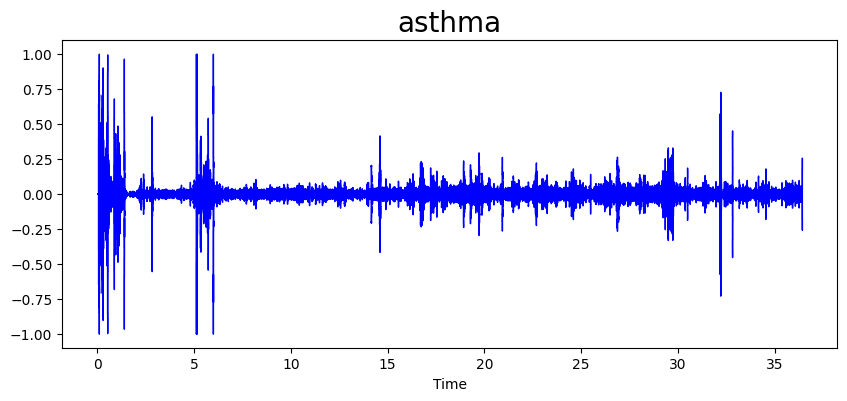

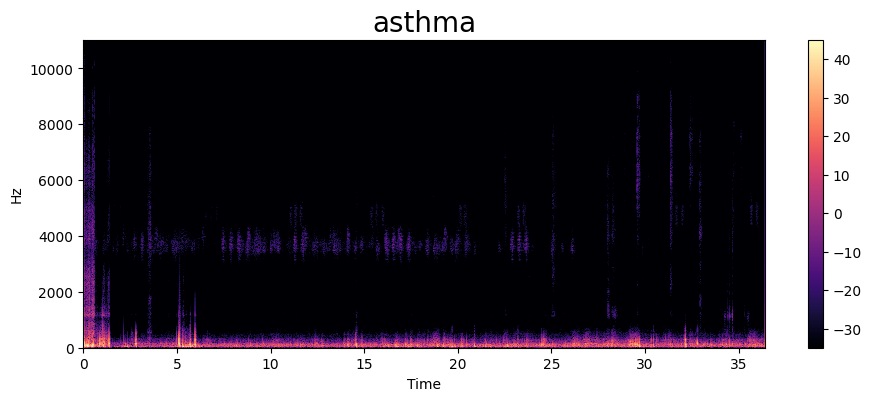

In [19]:
sound = 'asthma'
path = np.array(df['sound'][df['label']==sound])[1]
data, sampling_rate = librosa.load(path)
waveplot(data, sampling_rate, sound)
spectogram(data, sampling_rate, sound)
Audio(path)

In [20]:
def extract_mfcc(filename):
    y, sr = librosa.load(filename, duration=3, offset=0.5)
    mfcc = np.mean(librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40).T, axis=0)
    return mfcc

In [21]:
extract_mfcc(df['sound'][0])

array([-4.4794748e+02,  1.2912518e+02,  8.8918526e+01,  7.3218185e+01,
        3.2653526e+01,  3.4589241e+01,  3.3146980e+01,  3.0819044e+00,
        3.4236989e+00,  7.1887517e+00,  2.6597400e+00,  1.2957210e+01,
        1.2081588e+01, -5.8528347e+00, -7.8592854e+00, -2.1086717e+00,
       -4.8139076e+00,  2.6806102e+00,  6.3584199e+00, -4.3334222e+00,
       -1.9380660e+00,  1.0726649e+00, -3.5133736e+00,  3.0293691e+00,
        2.4918137e+00, -4.0882716e+00,  3.1161231e-01, -1.0897959e-01,
       -2.0595763e+00,  1.2826163e+00, -9.5808977e-01, -3.8160338e+00,
       -3.2275412e+00, -3.7861276e+00, -3.7853868e+00, -1.7568287e+00,
       -2.5914826e+00, -4.3582196e+00, -2.4104693e+00, -2.7784202e+00],
      dtype=float32)

In [22]:
X_mfcc = df['sound'].apply(lambda x: extract_mfcc(x))

In [23]:
X_mfcc

0     [-447.94748, 129.12518, 88.918526, 73.218185, ...
1     [-592.3962, 147.781, 77.65411, 48.966484, 30.5...
2     [-457.4331, 104.90915, 63.763912, 54.471863, 3...
3     [-581.9238, 140.76349, 65.695175, 53.311924, 2...
4     [-427.87704, 107.45798, 63.847973, 55.334877, ...
5     [-510.11118, 128.68236, 69.91408, 44.54948, 24...
6     [-462.71576, 120.95991, 68.36548, 79.062775, 3...
7     [-529.49414, 125.073395, 81.229225, 52.82414, ...
8     [-502.5357, 130.53041, 84.15528, 71.70655, 37....
9     [-593.08276, 156.48582, 73.18872, 52.89152, 30...
10    [-431.29645, 147.48734, 79.372955, 65.13396, 2...
11    [-504.20685, 103.340866, 76.78768, 53.5153, 35...
12    [-431.83826, 137.47821, 95.2214, 73.39948, 35....
13    [-471.84958, 115.83192, 87.681564, 60.465992, ...
14    [-395.31424, 132.49849, 66.51494, 40.321716, 3...
15    [-461.67883, 113.250854, 88.80926, 64.09135, 4...
16    [-424.405, 106.56779, 81.73651, 60.629253, 42....
17    [-480.6679, 141.97086, 68.449715, 40.02288

In [24]:
X = [x for x in X_mfcc]
X = np.array(X)
X.shape

(30, 40)

In [25]:
## input split
X = np.expand_dims(X, -1)
X.shape

(30, 40, 1)

In [26]:
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder()
y = enc.fit_transform(df[['label']])

In [27]:
y = y.toarray()

In [28]:
y.shape

(30, 2)

In [53]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout

model = Sequential([
    LSTM(256, return_sequences=False, input_shape=(40,1)),
    Dropout(0.2),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dropout(0.2),
    Dense(2, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 256)               264192    
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                                 
 dense_6 (Dense)             (None, 128)               32896     
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 dropout_8 (Dropout)         (None, 64)                0         
                                                                 
 dense_8 (Dense)             (None, 2)                

In [54]:
# Train the model
history = model.fit(X, y, validation_split=0.3, epochs=200, batch_size=64)

Epoch 1/200
1/1 [==============================] - 5s 5s/step - loss: 0.6778 - accuracy: 0.4762 - val_loss: 0.6112 - val_accuracy: 0.5556
Epoch 2/200
1/1 [==============================] - 0s 119ms/step - loss: 0.6682 - accuracy: 0.4762 - val_loss: 0.5940 - val_accuracy: 0.5556
Epoch 3/200
1/1 [==============================] - 0s 112ms/step - loss: 0.6565 - accuracy: 0.5238 - val_loss: 0.5850 - val_accuracy: 0.5556
Epoch 4/200
1/1 [==============================] - 0s 101ms/step - loss: 0.6211 - accuracy: 0.5714 - val_loss: 0.5652 - val_accuracy: 0.5556
Epoch 5/200
1/1 [==============================] - 0s 105ms/step - loss: 0.5822 - accuracy: 0.6667 - val_loss: 0.5193 - val_accuracy: 0.7778
Epoch 6/200
1/1 [==============================] - 0s 100ms/step - loss: 0.4852 - accuracy: 0.9048 - val_loss: 0.4597 - val_accuracy: 0.8889
Epoch 7/200
1/1 [==============================] - 0s 106ms/step - loss: 0.4328 - accuracy: 0.9048 - val_loss: 0.4149 - val_accuracy: 0.7778
Epoch 8/200
1/1 

In [31]:
# Save the model to a file
model.save("model.h5")

In [31]:
from keras.models import load_model

# Load the saved model
loaded_model = load_model("model.h5")

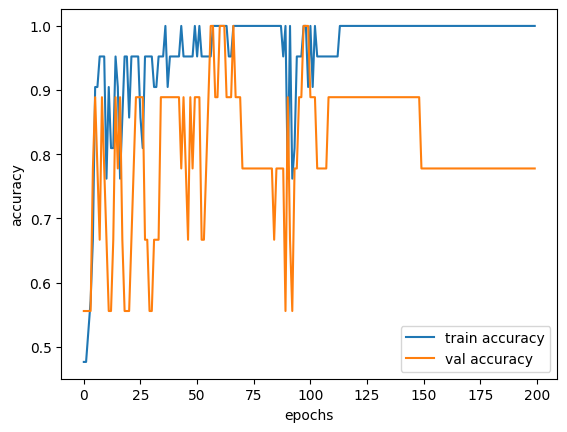

In [55]:
epochs = list(range(200))
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, label='train accuracy')
plt.plot(epochs, val_acc, label='val accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

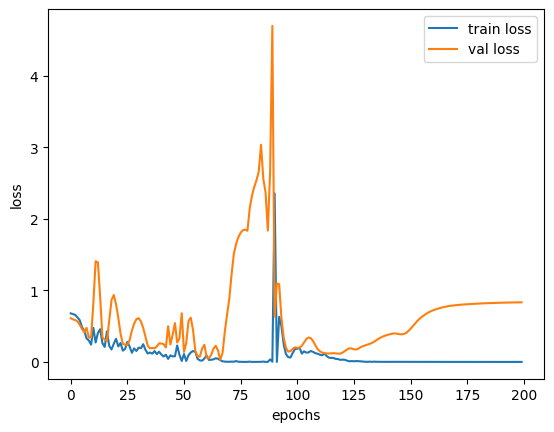

In [56]:
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochs, loss, label='train loss')
plt.plot(epochs, val_loss, label='val loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

In [52]:
def extract_mfcc(data, sr):
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sr, n_mfcc=40).T, axis=0)
    return mfcc

audio_path = './NewDatasetChng/Recordings/12_asthma.wav'
data, sampling_rate = librosa.load(audio_path)
mfcc = extract_mfcc(data, sampling_rate)

# Reshape the MFCCs to match the input shape of the model
mfcc = np.expand_dims(mfcc, axis=0)
mfcc = np.expand_dims(mfcc, axis=-1)

# Pass the MFCCs through the trained model
prediction = loaded_model.predict(mfcc)

# Interpret the model's prediction
emotion_labels = ['asthma', 'normal']
predicted_emotion = emotion_labels[np.argmax(prediction)]

print('Predicted Sound:', predicted_emotion)

1/1 [==============================] - 0s 24ms/step
Predicted Sound: asthma
